In [1]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 1.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=d4e71422d2949883be729890923995aa749e5a76286acdc941ec2bf731e03978
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [2]:
# Importing necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.metrics import confusion_matrix, classification_report

import lime
import lime.lime_tabular

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [3]:
cod = pd.read_csv("/content/cod.csv")

In [4]:
cod.head()

,name,wins,kills,kdRatio,killstreak,level,losses,prestige,hits,timePlayed,headshots,averageTime,gamesPlayed,assists,misses,xp,scorePerMinute,shots,deaths
0,RggRt45#4697369,0,0,0.00000,0,1,0,0,0,0,0,0.0,0,0,0,0,0.0,0,0
1,JohniceRex#9176033,0,0,0.00000,0,1,0,110,0,7,0,7.0,0,0,0,700,0.0,0,16
2,bootybootykill#1892064,0,66,1.03125,0,9,0,110,0,32,16,32.0,0,1,0,48300,0.0,0,64
3,JNaCo#5244172,3,2,0.40000,0,1,0,0,0,3,0,3.0,0,0,0,1150,0.0,0,5
4,gomezyayo_007#6596687,0,2,0.20000,0,1,0,110,0,5,1,5.0,0,0,0,1000,0.0,0,10


In [5]:
cod.describe()

,wins,kills,kdRatio,killstreak,level,losses,prestige,hits,timePlayed,headshots,averageTime,gamesPlayed,assists,misses,xp,scorePerMinute,shots,deaths
count,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1.558000e+03,1558.000000,1.558000e+03,1558.000000
mean,153.002567,3753.001926,0.637098,6.895379,44.414634,4.998074,47.657253,10330.189987,425.915918,630.672657,21.428416,116.695764,685.797176,45356.671374,8.726335e+05,107.868825,5.568677e+04,3875.397946
std,301.984766,7929.696675,0.430459,10.184677,68.318064,7.005778,51.626213,22954.104384,786.182499,1305.150393,82.640000,256.354836,1518.383825,97919.428339,1.795755e+06,116.526676,1.202811e+05,7992.666443
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000
25%,0.000000,4.000000,0.261442,0.000000,1.000000,0.000000,0.000000,0.000000,4.000000,1.000000,2.000000,0.000000,0.000000,0.000000,2.106250e+03,0.000000,0.000000e+00,14.000000
50%,10.000000,191.500000,0.732837,5.000000,11.000000,2.000000,14.000000,214.500000,51.000000,32.000000,3.031116,3.000000,36.500000,1307.500000,6.396800e+04,56.793995,1.565000e+03,269.000000
75%,168.000000,3445.750000,0.955293,12.000000,51.000000,8.000000,110.000000,9015.500000,485.500000,602.750000,9.085714,110.500000,609.750000,40906.750000,8.286690e+05,221.648976,5.078100e+04,3698.750000
max,3519.000000,66935.000000,3.000000,235.000000,435.000000,80.000000,117.000000,209851.000000,7479.000000,11719.000000,1349.000000,3745.000000,14531.000000,965775.000000,1.497054e+07,413.800000,1.166620e+06,67888.000000


## Data Preprocessing

In [6]:
# Check for missing data
print("\nMissing data in the dataset:")
print(cod.isnull().sum())


Missing data in the dataset:
name              0
wins              0
kills             0
kdRatio           0
killstreak        0
level             0
losses            0
prestige          0
hits              0
timePlayed        0
headshots         0
averageTime       0
gamesPlayed       0
assists           0
misses            0
xp                0
scorePerMinute    0
shots             0
deaths            0
dtype: int64


In [7]:
# Drop 'name' column as it's unlikely to contribute to the prediction
cod = cod.drop('name', axis=1)

## Exploratory Data Analysis (EDA)

In [8]:
cod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1558 entries, 0 to 1557
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   wins            1558 non-null   int64  
 1   kills           1558 non-null   int64  
 2   kdRatio         1558 non-null   float64
 3   killstreak      1558 non-null   int64  
 4   level           1558 non-null   int64  
 5   losses          1558 non-null   int64  
 6   prestige        1558 non-null   int64  
 7   hits            1558 non-null   int64  
 8   timePlayed      1558 non-null   int64  
 9   headshots       1558 non-null   int64  
 10  averageTime     1558 non-null   float64
 11  gamesPlayed     1558 non-null   int64  
 12  assists         1558 non-null   int64  
 13  misses          1558 non-null   int64  
 14  xp              1558 non-null   int64  
 15  scorePerMinute  1558 non-null   float64
 16  shots           1558 non-null   int64  
 17  deaths          1558 non-null   i

In [9]:
cod.describe()

,wins,kills,kdRatio,killstreak,level,losses,prestige,hits,timePlayed,headshots,averageTime,gamesPlayed,assists,misses,xp,scorePerMinute,shots,deaths
count,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1558.000000,1.558000e+03,1558.000000,1.558000e+03,1558.000000
mean,153.002567,3753.001926,0.637098,6.895379,44.414634,4.998074,47.657253,10330.189987,425.915918,630.672657,21.428416,116.695764,685.797176,45356.671374,8.726335e+05,107.868825,5.568677e+04,3875.397946
std,301.984766,7929.696675,0.430459,10.184677,68.318064,7.005778,51.626213,22954.104384,786.182499,1305.150393,82.640000,256.354836,1518.383825,97919.428339,1.795755e+06,116.526676,1.202811e+05,7992.666443
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000
25%,0.000000,4.000000,0.261442,0.000000,1.000000,0.000000,0.000000,0.000000,4.000000,1.000000,2.000000,0.000000,0.000000,0.000000,2.106250e+03,0.000000,0.000000e+00,14.000000
50%,10.000000,191.500000,0.732837,5.000000,11.000000,2.000000,14.000000,214.500000,51.000000,32.000000,3.031116,3.000000,36.500000,1307.500000,6.396800e+04,56.793995,1.565000e+03,269.000000
75%,168.000000,3445.750000,0.955293,12.000000,51.000000,8.000000,110.000000,9015.500000,485.500000,602.750000,9.085714,110.500000,609.750000,40906.750000,8.286690e+05,221.648976,5.078100e+04,3698.750000
max,3519.000000,66935.000000,3.000000,235.000000,435.000000,80.000000,117.000000,209851.000000,7479.000000,11719.000000,1349.000000,3745.000000,14531.000000,965775.000000,1.497054e+07,413.800000,1.166620e+06,67888.000000


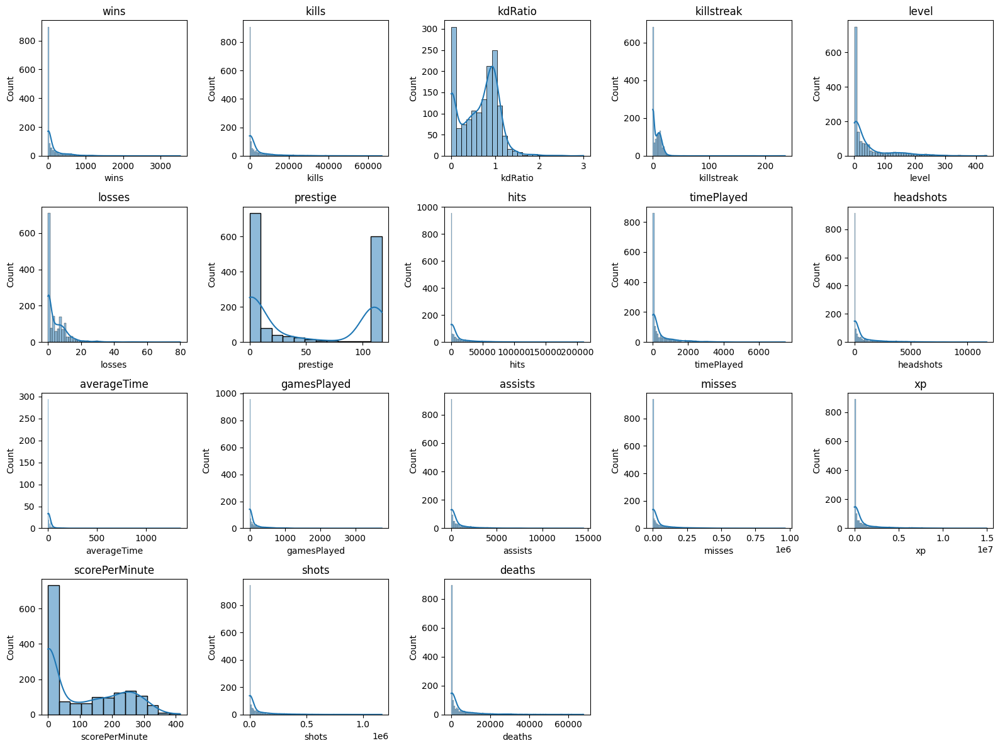

In [10]:
# Distribution plots for numerical features
plt.figure(figsize=(16, 12))
for i, col in enumerate(cod.columns):
    plt.subplot(4, 5, i + 1)
    sns.histplot(cod[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()

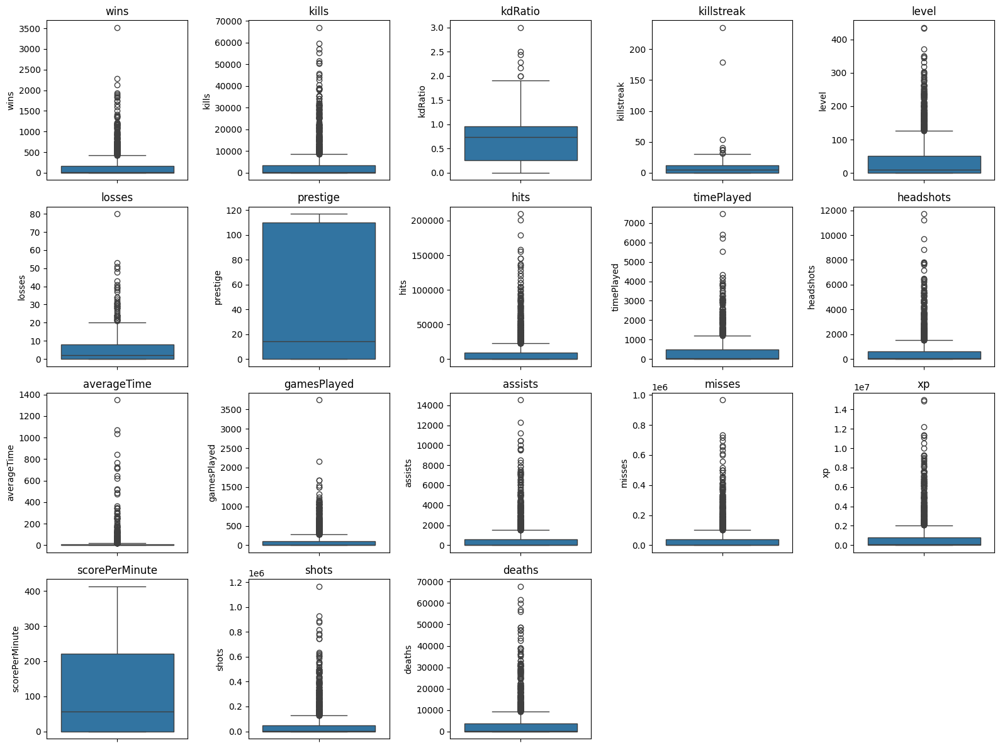

In [11]:
# Box plots for numerical features
plt.figure(figsize=(16, 12))
for i, col in enumerate(cod.columns):
    plt.subplot(4, 5, i + 1)
    sns.boxplot(y=cod[col])
    plt.title(col)
plt.tight_layout()
plt.show()

## Feature Extraction/Engineering

In [12]:
# Feature creation for new dataset
tmp_day_earliest = cod.groupby('wins')['timePlayed'].min()
tmp_day_latest = cod.groupby('wins')['timePlayed'].max()
tmp_level = cod.groupby('wins')['level'].max()
tmp_days = cod.groupby('wins')['gamesPlayed'].nunique()
tmp_wins = cod.groupby('wins')['wins'].sum()
tmp_kills = cod.groupby('wins')['kills'].sum()
tmp_kdRatio = tmp_kills / cod.groupby('wins')['deaths'].sum()
tmp_killstreak = cod.groupby('wins')['killstreak'].max()
tmp_losses = cod.groupby('wins')['losses'].sum()
tmp_prestige = cod.groupby('wins')['prestige'].max()
tmp_hits = cod.groupby('wins')['hits'].sum()
tmp_headshots = cod.groupby('wins')['headshots'].sum()
tmp_averageTime = cod.groupby('wins')['averageTime'].mean()
tmp_assists = cod.groupby('wins')['assists'].sum()
tmp_misses = cod.groupby('wins')['misses'].sum()
tmp_xp = cod.groupby('wins')['xp'].sum()
tmp_scorePerMinute = cod.groupby('wins')['scorePerMinute'].mean()
tmp_shots = cod.groupby('wins')['shots'].sum()
tmp_deaths = cod.groupby('wins')['deaths'].sum()

In [13]:

# Create new dataframe
new_cod = {
    'Wins': tmp_wins.values,
    'Kills': tmp_kills.values,
    'KD_Ratio': tmp_kdRatio.values,
    'Killstreak': tmp_killstreak.values,
    'Level': tmp_level.values,
    'Losses': tmp_losses.values,
    'Prestige': tmp_prestige.values,
    'Hits': tmp_hits.values,
    'Time_Played': tmp_day_latest.values,
    'Headshots': tmp_headshots.values,
    'Average_Time': tmp_averageTime.values,
    'Games_Played': tmp_days.values,
    'Assists': tmp_assists.values,
    'Misses': tmp_misses.values,
    'XP': tmp_xp.values,
    'Score_Per_Minute': tmp_scorePerMinute.values,
    'Shots': tmp_shots.values,
    'Deaths': tmp_deaths.values
}

sa_total = pd.DataFrame(new_cod)
sa_total.head()

,Wins,Kills,KD_Ratio,Killstreak,Level,Losses,Prestige,Hits,Time_Played,Headshots,Average_Time,Games_Played,Assists,Misses,XP,Score_Per_Minute,Shots,Deaths
0,0,25164,0.775040,7,141,130,113,956,1070,5291,23.356333,5,4919,5823,20731051,4.819307,6779,32468
1,65,5939,0.711428,9,137,50,111,2529,1035,1119,42.241026,5,1015,13580,4368416,99.775873,16109,8348
2,82,5801,0.784980,12,115,52,111,4121,728,1103,52.762195,7,982,20370,4745446,94.243198,24491,7390
3,117,4090,0.808141,17,82,56,110,6353,685,827,17.345353,9,535,33060,2356065,129.753482,39413,5061
4,100,2961,0.775537,10,42,49,111,4781,295,524,25.770308,9,656,28037,1698240,143.294082,32818,3818


In [14]:
# Additional Feature Engineering
sa_total['KD_Ratio'] = sa_total['Kills'] / sa_total['Deaths']
sa_total

,Wins,Kills,KD_Ratio,Killstreak,Level,Losses,Prestige,Hits,Time_Played,Headshots,Average_Time,Games_Played,Assists,Misses,XP,Score_Per_Minute,Shots,Deaths
0,0,25164,0.775040,7,141,130,113,956,1070,5291,23.356333,5,4919,5823,20731051,4.819307,6779,32468
1,65,5939,0.711428,9,137,50,111,2529,1035,1119,42.241026,5,1015,13580,4368416,99.775873,16109,8348
2,82,5801,0.784980,12,115,52,111,4121,728,1103,52.762195,7,982,20370,4745446,94.243198,24491,7390
3,117,4090,0.808141,17,82,56,110,6353,685,827,17.345353,9,535,33060,2356065,129.753482,39413,5061
4,100,2961,0.775537,10,42,49,111,4781,295,524,25.770308,9,656,28037,1698240,143.294082,32818,3818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,1899,17342,0.654390,12,264,39,111,39770,3899,2148,4.011317,1,3052,289101,7634027,149.854424,328871,26501
454,1930,57116,0.925840,18,300,9,111,158128,4181,8838,2.798527,1,9650,660264,9218954,243.988472,818392,61691
455,2137,25177,0.884956,13,175,16,24,72461,3887,3259,3.677389,1,5026,415655,3856965,193.078672,488116,28450
456,2282,38200,1.149702,13,331,16,111,51440,6425,4707,2.974537,1,6259,354971,10525046,199.797292,406411,33226


In [15]:
# Define churn criteria based on percentiles
wins_threshold = sa_total['Wins'].quantile(0.20)
kills_threshold = sa_total['Kills'].quantile(0.20)
kdRatio_threshold = sa_total['KD_Ratio'].quantile(0.20)
level_threshold = sa_total['Level'].quantile(0.20)
losses_threshold = sa_total['Losses'].quantile(0.80)
hits_threshold = sa_total['Hits'].quantile(0.20)
assists_threshold = sa_total['Assists'].quantile(0.20)
xp_threshold = sa_total['XP'].quantile(0.20)

# Classify churn based on criteria
sa_total['Churn'] = ((sa_total['Wins'] < wins_threshold) |
                     (sa_total['Kills'] < kills_threshold) |
                     (sa_total['KD_Ratio'] < kdRatio_threshold) |
                     (sa_total['Level'] < level_threshold) |
                     (sa_total['Losses'] > losses_threshold) |
                     (sa_total['Hits'] < hits_threshold) |
                     (sa_total['Assists'] < assists_threshold) |
                     (sa_total['XP'] < xp_threshold)).astype(int)

# Display the DataFrame with the 'Churn' column
print(sa_total['Churn'])


0      1
1      1
2      1
3      1
4      1
      ..
453    1
454    0
455    0
456    0
457    0
Name: Churn, Length: 458, dtype: int64


In [16]:
print(sa_total['Churn'].value_counts())


Churn
1    242
0    216
Name: count, dtype: int64


## Model Building

### Sample split

In [17]:
# Modify the feature columns as needed
X = sa_total.drop(['Churn'], axis=1)
y = sa_total['Churn']

In [18]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Model Training

In [19]:
# Initialize models
models = {
    'Gaussian Naive Bayes': GaussianNB(),
    'Perceptron': Perceptron(),
    'Gradient Boosting Classifier': GradientBoostingClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Logistic Regression': LogisticRegression(),
    'XGBoost': xgb.XGBClassifier()
}

In [20]:
for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_train, y_train)

Training Gaussian Naive Bayes...
Training Perceptron...
Training Gradient Boosting Classifier...
Training Decision Tree...
Training Logistic Regression...
Training XGBoost...


In [21]:
# Train a logistic regression model to approximate the predictions of Perceptron
lr_surrogate = LogisticRegression()
lr_surrogate.fit(X_train, models['Perceptron'].predict(X_train))

LogisticRegression()

## Evaluation

In [22]:
import numpy as np
import matplotlib.pyplot as plt

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

# Example usage:
# confusion_matrix = ...  # Your confusion matrix
# classes = ['Not Churned', 'Churned']
# plot_confusion_matrix(confusion_matrix, classes=classes, normalize=False, title='Confusion matrix')
# plt.show()


Evaluating Gaussian Naive Bayes...
Confusion Matrix for Gaussian Naive Bayes:
[[25 15]
 [11 41]]
Confusion matrix, without normalization


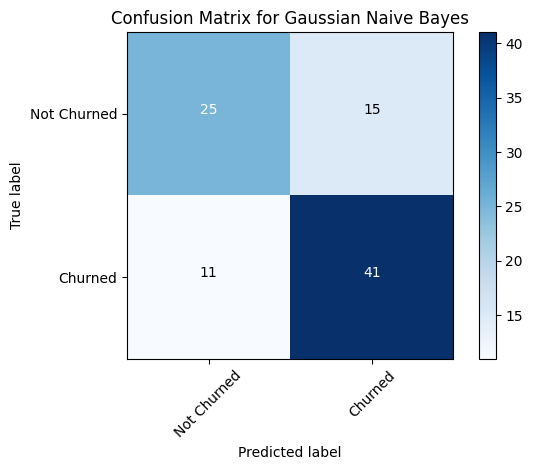


Classification Report for Gaussian Naive Bayes:
              precision    recall  f1-score   support

           0       0.69      0.62      0.66        40
           1       0.73      0.79      0.76        52

    accuracy                           0.72        92
   macro avg       0.71      0.71      0.71        92
weighted avg       0.72      0.72      0.72        92

Accuracy for Gaussian Naive Bayes: 0.717391304347826
F1-score for Gaussian Naive Bayes: 0.7151877277735401


Evaluating Perceptron...
Confusion Matrix for Perceptron:
[[ 2 38]
 [ 5 47]]
Confusion matrix, without normalization


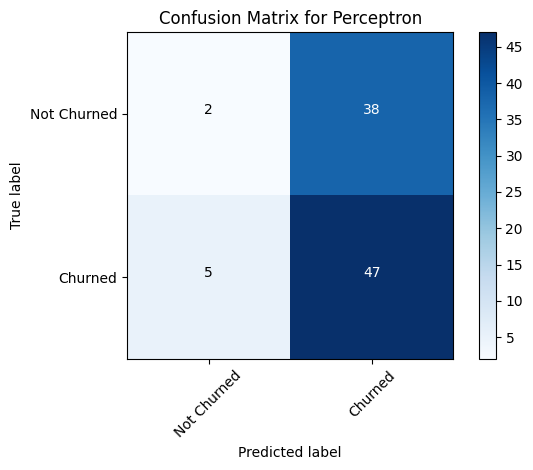


Classification Report for Perceptron:
              precision    recall  f1-score   support

           0       0.29      0.05      0.09        40
           1       0.55      0.90      0.69        52

    accuracy                           0.53        92
   macro avg       0.42      0.48      0.39        92
weighted avg       0.44      0.53      0.42        92

Accuracy for Perceptron: 0.532608695652174
F1-score for Perceptron: 0.4248161677819267


Evaluating Gradient Boosting Classifier...
Confusion Matrix for Gradient Boosting Classifier:
[[39  1]
 [ 3 49]]
Confusion matrix, without normalization


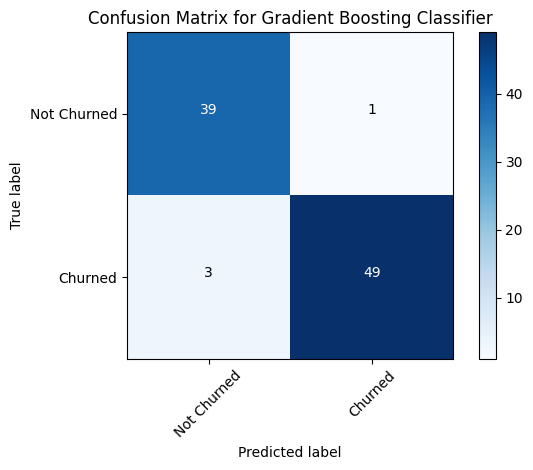


Classification Report for Gradient Boosting Classifier:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95        40
           1       0.98      0.94      0.96        52

    accuracy                           0.96        92
   macro avg       0.95      0.96      0.96        92
weighted avg       0.96      0.96      0.96        92

Accuracy for Gradient Boosting Classifier: 0.9565217391304348
F1-score for Gradient Boosting Classifier: 0.9566257043644606


Evaluating Decision Tree...
Confusion Matrix for Decision Tree:
[[39  1]
 [ 4 48]]
Confusion matrix, without normalization


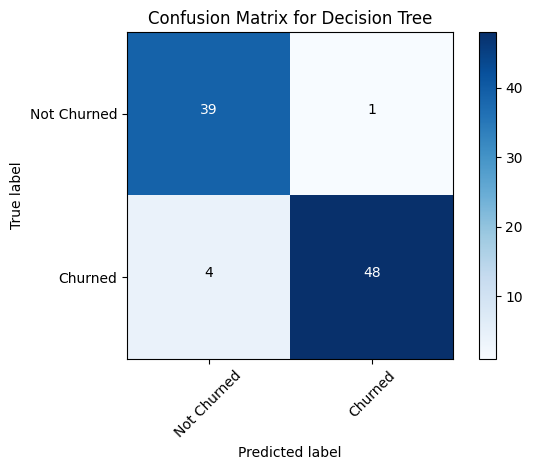


Classification Report for Decision Tree:
              precision    recall  f1-score   support

           0       0.91      0.97      0.94        40
           1       0.98      0.92      0.95        52

    accuracy                           0.95        92
   macro avg       0.94      0.95      0.95        92
weighted avg       0.95      0.95      0.95        92

Accuracy for Decision Tree: 0.9456521739130435
F1-score for Decision Tree: 0.9458272176091365


Evaluating Logistic Regression...
Confusion Matrix for Logistic Regression:
[[33  7]
 [24 28]]
Confusion matrix, without normalization


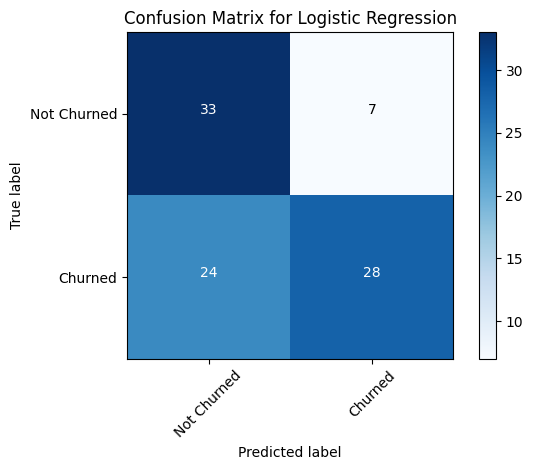


Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.58      0.82      0.68        40
           1       0.80      0.54      0.64        52

    accuracy                           0.66        92
   macro avg       0.69      0.68      0.66        92
weighted avg       0.70      0.66      0.66        92

Accuracy for Logistic Regression: 0.6630434782608695
F1-score for Logistic Regression: 0.6596495566649665


Evaluating XGBoost...
Confusion Matrix for XGBoost:
[[40  0]
 [ 3 49]]
Confusion matrix, without normalization


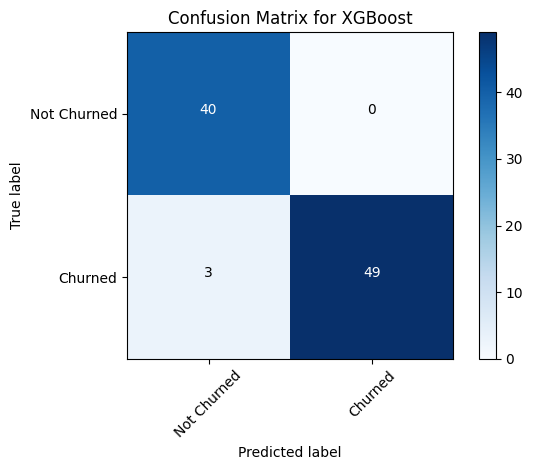


Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96        40
           1       1.00      0.94      0.97        52

    accuracy                           0.97        92
   macro avg       0.97      0.97      0.97        92
weighted avg       0.97      0.97      0.97        92

Accuracy for XGBoost: 0.967391304347826
F1-score for XGBoost: 0.9674963305654818




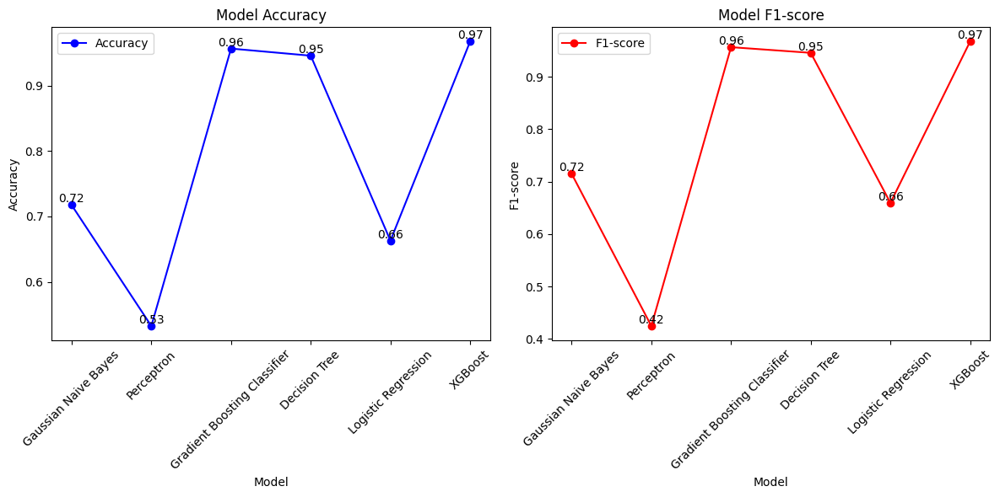

In [23]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score
import numpy as np

# Initialize lists to store metrics
model_names = []
accuracies = []
f1_scores = []

# Evaluate models separately
for name, model in models.items():
    print(f"Evaluating {name}...")

    # Predictions
    y_pred = model.predict(X_test)

    # Confusion matrix
    print(f"Confusion Matrix for {name}:")
    cm = confusion_matrix(y_test, y_pred)
    print(cm)

    # Plot confusion matrix
    plot_confusion_matrix(cm, classes=['Not Churned', 'Churned'], normalize=False, title=f'Confusion Matrix for {name}')
    plt.show()

    # Classification report
    print(f"\nClassification Report for {name}:")
    report = classification_report(y_test, y_pred)
    print(report)

    # Calculate accuracy and F1-score
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Append metrics to lists
    model_names.append(name)
    accuracies.append(accuracy)
    f1_scores.append(f1)

    print(f"Accuracy for {name}: {accuracy}")
    print(f"F1-score for {name}: {f1}")
    print()
    print()

# Plot line graph for accuracy and F1-score
plt.figure(figsize=(12, 6))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(model_names, accuracies, marker='o', label='Accuracy', color='b')
plt.title('Model Accuracy')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
plt.legend()
# Annotate data points with the number of samples
for i, (name, accuracy) in enumerate(zip(model_names, accuracies)):
    plt.text(i, accuracy, f"{accuracy:.2f}", ha='center', va='bottom')

# F1-score plot
plt.subplot(1, 2, 2)
plt.plot(model_names, f1_scores, marker='o', label='F1-score', color='r')
plt.title('Model F1-score')
plt.xlabel('Model')
plt.ylabel('F1-score')
plt.xticks(rotation=45)
plt.legend()
# Annotate data points with the number of samples
for i, (name, f1) in enumerate(zip(model_names, f1_scores)):
    plt.text(i, f1, f"{f1:.2f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()


## Interpretability

In [24]:
# Apply LIME for model interpretation
# Select a specific instance from the test set for explanation
instance_idx = 0
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X.columns.tolist(),
                                                   class_names=['Not Churned', 'Churned'],
                                                   discretize_continuous=True)


In [25]:
# Apply LIME for model interpretation
for name, model in models.items():
    print(f"Explaining predictions of {name}...")
    if name == 'Perceptron':
        # Use logistic regression surrogate model
        exp = explainer.explain_instance(X_test.iloc[instance_idx], lr_surrogate.predict_proba)
    else:
        exp = explainer.explain_instance(X_test.iloc[instance_idx], model.predict_proba)
    exp.show_in_notebook()

Explaining predictions of Gaussian Naive Bayes...


Explaining predictions of Perceptron...


Explaining predictions of Gradient Boosting Classifier...


Explaining predictions of Decision Tree...


Explaining predictions of Logistic Regression...


Explaining predictions of XGBoost...
